In [164]:
# %% [markdown]
# # 🔬 Predicción de mineralogía sin transformación CLR
# 
# Este notebook evalúa el rendimiento de un modelo Random Forest multisalida para predecir porcentajes de arcillas, cuarzo y carbonatos directamente (sin usar transformaciones composicionales como CLR).
# 
# **Objetivo:** Evaluar si este enfoque mejora la capacidad de generalización, especialmente en valores extremos.

# %% 📦 Librerías
import warnings
warnings.filterwarnings("ignore")

# Manipulación de datos
import numpy as np
import pandas as pd

# Machine Learning
from sklearn.ensemble import RandomForestRegressor
from sklearn.multioutput import MultiOutputRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# Visualización
import matplotlib.pyplot as plt
import seaborn as sns

# Estilo visual
plt.rcParams["figure.dpi"] = 300

In [165]:
features = ['Sonic', 'GammaRay', 'NeutronPorosity', 'Resistivity', 'Density',
            'Photoelectric', 'AvgPorosity', 'RHOMAA', 'UMA', 'GR_Dens', 'PEF_Dens']
target = ['Clay', 'Quartz', 'Carbonates']

### Cargar combined_df

In [166]:
vmm_df = pd.read_csv('data/combined_df_VMM.csv', skiprows=1)

In [167]:
catatumbo_df = pd.read_csv('data/combined_df_catatumbo.csv', skiprows=1)

In [168]:
catatumbo_df.head()

,Depth,Clay,Quartz,Carbonates,GammaRay,NeutronPorosity,Resistivity,Density,GR_Dens,Porosity,Sonic,TOC,AvgPorosity,Photoelectric,RHOMAA,UMA,PEF_Dens,Well
0,3969.75,6.249976,37.376395,56.373629,78.643553,0.010161,1170.551553,2.642048,29.766132,0.010814,58.444386,3.899055,0.010488,3.247959,2.659452,8.666917,1.229334,Cerro Gordo
1,3970.80,7.630743,45.047386,47.321871,78.480317,0.008292,1167.594647,2.645179,29.669185,0.008928,57.963118,3.874733,0.008610,3.412304,2.659468,9.100204,1.290009,Cerro Gordo
2,3971.60,3.498313,73.719427,22.782260,80.599120,0.007463,1021.735200,2.645330,30.468451,0.008837,57.924186,3.741526,0.008150,3.609310,2.658850,9.622163,1.364408,Cerro Gordo
3,3972.10,11.433496,65.508263,23.058241,78.569370,0.005483,1051.229209,2.648003,29.671184,0.007227,58.080087,3.776628,0.006355,3.875708,2.658543,10.325329,1.463635,Cerro Gordo
4,3972.50,9.537947,41.145604,49.316449,69.597500,0.004168,1083.491644,2.650692,26.256351,0.005607,58.417025,3.821687,0.004888,3.718010,2.658800,9.901250,1.402656,Cerro Gordo


In [169]:
# combine both dataframes
combined_df = pd.concat([vmm_df, catatumbo_df], ignore_index=True)

In [170]:
combined_df.head()

,Well,Depth,Clay,Quartz,Carbonates,TOC,Formation,Sonic,GammaRay,NeutronPorosity,Resistivity,Density,Photoelectric,AvgPorosity,RHOMAA,UMA,GR_Dens,PEF_Dens,Porosity
0,Coyote-1,7200.0,48.675996,49.526372,1.797632,2.672507,El Salto,80.00674,61.79465,0.24560,21.25296,2.59795,5.7005,0.200711,2.999215,18.402937,23.785927,2.194230,NaN
1,Coyote-1,7214.5,28.392838,57.018752,14.588410,3.218767,El Salto,74.89855,109.48310,0.25430,36.39704,2.46675,8.7508,0.226427,2.896073,27.757992,44.383541,3.547502,NaN
2,Coyote-1,7215.0,82.689167,16.548721,0.762112,3.976217,El Salto,75.93570,106.21910,0.25615,42.38375,2.47125,8.9295,0.227161,2.903694,28.406222,42.981932,3.613354,NaN
3,Coyote-1,7232.0,82.195781,17.577069,0.227150,8.061749,El Salto,76.33705,115.05360,0.28790,184.61350,2.37395,7.7611,0.265648,2.870970,24.908553,48.465048,3.269277,NaN
4,Coyote-1,7240.0,39.656924,43.132829,17.210247,4.956246,El Salto,77.64470,117.64320,0.18490,51.75293,2.35775,7.9863,0.191456,2.679253,23.170002,49.896384,3.387255,NaN


In [171]:
combined_df.columns

Index(['Well', 'Depth', 'Clay', 'Quartz', 'Carbonates', 'TOC', 'Formation',
       'Sonic', 'GammaRay', 'NeutronPorosity', 'Resistivity', 'Density',
       'Photoelectric', 'AvgPorosity', 'RHOMAA', 'UMA', 'GR_Dens', 'PEF_Dens',
       'Porosity'],
      dtype='object')

In [172]:
features = ['Sonic', 'GammaRay', 'NeutronPorosity', 'Resistivity', 'Density',
            'Photoelectric', 'AvgPorosity', 'RHOMAA', 'UMA', 'GR_Dens', 'PEF_Dens']
            
target = ['Clay', 'Quartz', 'Carbonates']

In [173]:
# only keep the features and target columns
columns_to_keep = ['Depth'] + features + target
combined_df = combined_df[columns_to_keep]

In [174]:
combined_df.fillna(0, inplace=True) # fill remaining nans with 0 as the NaN values are actually zeros in the original data

<Axes: >

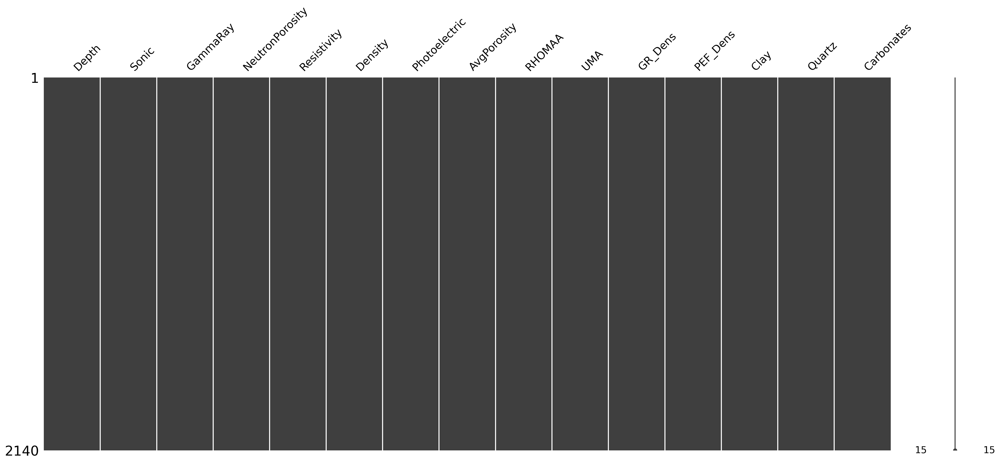

In [175]:
import missingno as msno
msno.matrix(combined_df)

In [176]:
df = combined_df.copy()

In [177]:
# %% (Opcional) Cortar extremos por percentil — configuración aquí
remove_extremes = True
pmin, pmax = 0.01, 0.99  # límites percentilares

if remove_extremes:
    for col in target:
        lower = df[col].quantile(pmin)
        upper = df[col].quantile(pmax)
        df = df[(df[col] >= lower) & (df[col] <= upper)]

In [178]:

print("✅ Dataset preparado:", df.shape)

# %% División X e y
X = df[features].values
y = df[target].values

✅ Dataset preparado: (2055, 15)


## Modelo base: Random Forest sin CLR


📊 Métricas ENTRENAMIENTO
Clay — R²: 0.934 | MAE: 3.67 | RMSE: 5.81
Quartz — R²: 0.915 | MAE: 4.83 | RMSE: 6.69
Carbonates — R²: 0.909 | MAE: 5.12 | RMSE: 7.44

📊 Métricas VALIDACIÓN
Clay — R²: 0.488 | MAE: 9.97 | RMSE: 15.78
Quartz — R²: 0.525 | MAE: 11.21 | RMSE: 15.31
Carbonates — R²: 0.462 | MAE: 12.70 | RMSE: 18.43


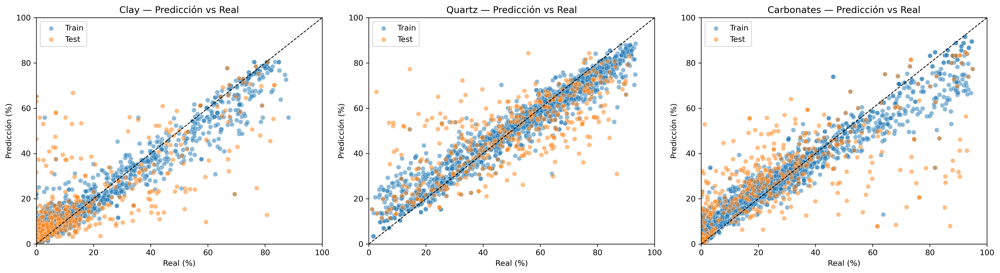

In [179]:

from sklearn.ensemble import RandomForestRegressor
from sklearn.multioutput import MultiOutputRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# División Train/Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Modelo base
base_rf = MultiOutputRegressor(RandomForestRegressor(random_state=42))
base_rf.fit(X_train, y_train)

# Predicción
y_train_pred = base_rf.predict(X_train)
y_test_pred = base_rf.predict(X_test)

# Métricas
def print_metrics(y_true, y_pred, stage=""):
    r2 = r2_score(y_true, y_pred, multioutput='raw_values')
    mae = mean_absolute_error(y_true, y_pred, multioutput='raw_values')
    rmse = np.sqrt(mean_squared_error(y_true, y_pred, multioutput='raw_values'))
    print(f"\n📊 Métricas {stage}")
    for i, mineral in enumerate(target):
        print(f"{mineral} — R²: {r2[i]:.3f} | MAE: {mae[i]:.2f} | RMSE: {rmse[i]:.2f}")

print_metrics(y_train, y_train_pred, "ENTRENAMIENTO")
print_metrics(y_test, y_test_pred, "VALIDACIÓN")

# %% Visualización
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for i, mineral in enumerate(target):
    sns.scatterplot(x=y_train[:, i], y=y_train_pred[:, i], label='Train', ax=axes[i], alpha=0.5)
    sns.scatterplot(x=y_test[:, i], y=y_test_pred[:, i], label='Test', ax=axes[i], alpha=0.5)
    axes[i].plot([0, 100], [0, 100], 'k--', lw=1)
    axes[i].set_xlim(0, 100)
    axes[i].set_ylim(0, 100)
    axes[i].set_title(f"{mineral} — Predicción vs Real")
    axes[i].set_xlabel("Real (%)")
    axes[i].set_ylabel("Predicción (%)")
    axes[i].legend()
plt.tight_layout()
plt.show()

In [180]:
import numpy as np
import random

# Escoge un índice aleatorio del test set
idx = random.randint(0, len(y_test) - 1)

# Extrae los valores reales y predichos
real = y_test[idx]
pred = y_test_pred[idx]

# Calcula sumas y error de cierre
sum_real = np.sum(real)
sum_pred = np.sum(pred)
closure_error = abs(sum_pred - 100)

# Muestra resultados
print(f"Índice aleatorio: {idx}")
print("🔹 Valores reales     :", np.round(real, 2), f"Suma: {sum_real:.2f}%")
print("🔸 Predicción modelo  :", np.round(pred, 2), f"Suma: {sum_pred:.2f}%")
print(f"❗ Error de cierre: {closure_error:.2f}%")

Índice aleatorio: 122
🔹 Valores reales     : [ 1.88 21.88 76.24] Suma: 100.00%
🔸 Predicción modelo  : [ 4.15 33.91 63.4 ] Suma: 101.46%
❗ Error de cierre: 1.46%


In [181]:
import pandas as pd
import numpy as np

# Creamos el DataFrame de resultados
results_df = pd.DataFrame({
    'Real_Clay': y_test[:, 0],
    'Real_Quartz': y_test[:, 1],
    'Real_Carbonates': y_test[:, 2],
    'Pred_Clay': y_test_pred[:, 0],
    'Pred_Quartz': y_test_pred[:, 1],
    'Pred_Carbonates': y_test_pred[:, 2],
})

# Sumas y error de cierre
results_df['Sum_Real'] = results_df[['Real_Clay', 'Real_Quartz', 'Real_Carbonates']].sum(axis=1)
results_df['Sum_Pred'] = results_df[['Pred_Clay', 'Pred_Quartz', 'Pred_Carbonates']].sum(axis=1)
results_df['Closure_Error'] = abs(results_df['Sum_Pred'] - 100)

# Errores absolutos por mineral
results_df['MAE_Clay'] = abs(results_df['Real_Clay'] - results_df['Pred_Clay'])
results_df['MAE_Quartz'] = abs(results_df['Real_Quartz'] - results_df['Pred_Quartz'])
results_df['MAE_Carbonates'] = abs(results_df['Real_Carbonates'] - results_df['Pred_Carbonates'])

# Mostrar resumen estadístico general
print("📊 Resumen estadístico de error de cierre:")
print(results_df['Closure_Error'].describe())


📊 Resumen estadístico de error de cierre:
count    4.110000e+02
mean     3.758867e+00
std      4.211174e+00
min      6.108962e-10
25%      6.604497e-01
50%      2.401216e+00
75%      5.194497e+00
max      2.332475e+01
Name: Closure_Error, dtype: float64


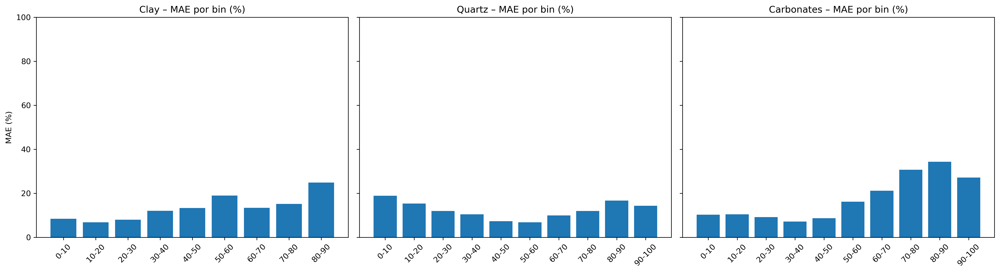

In [189]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 1. Crear DataFrame de resultados
results_df = pd.DataFrame(y_test, columns=['Clay_real', 'Quartz_real', 'Carbonates_real'])
results_df[['Clay_pred', 'Quartz_pred', 'Carbonates_pred']] = y_test_pred

# 2. Calcular error de cierre y error absoluto por mineral
results_df['Closure_Error'] = abs(results_df[['Clay_pred', 'Quartz_pred', 'Carbonates_pred']].sum(axis=1) - 100)
results_df['Clay_abs_error'] = abs(results_df['Clay_real'] - results_df['Clay_pred'])
results_df['Quartz_abs_error'] = abs(results_df['Quartz_real'] - results_df['Quartz_pred'])
results_df['Carbonates_abs_error'] = abs(results_df['Carbonates_real'] - results_df['Carbonates_pred'])

# 3. Definir función para agrupar por bins y calcular MAE
def mae_by_bin(real_col, abs_error_col, bin_width=10):
    bins = np.arange(0, 110, bin_width)
    labels = [f'{i}-{i+bin_width}' for i in bins[:-1]]
    binned = pd.cut(results_df[real_col], bins=bins, labels=labels, include_lowest=True)
    grouped = results_df.groupby(binned)[abs_error_col].mean()
    return grouped

# 4. Calcular MAE por bin
clay_mae_bins = mae_by_bin('Clay_real', 'Clay_abs_error')
quartz_mae_bins = mae_by_bin('Quartz_real', 'Quartz_abs_error')
carbonates_mae_bins = mae_by_bin('Carbonates_real', 'Carbonates_abs_error')

# 5. Visualización
fig, axs = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

axs[0].bar(clay_mae_bins.index.astype(str), clay_mae_bins.values)
axs[0].set_title('Clay – MAE por bin (%)')
axs[0].set_ylabel('MAE (%)')
axs[0].set_ylim(0, 100)
axs[0].set_xticklabels(clay_mae_bins.index, rotation=45)

axs[1].bar(quartz_mae_bins.index.astype(str), quartz_mae_bins.values)
axs[1].set_title('Quartz – MAE por bin (%)')
axs[1].set_ylim(0, 100)
axs[1].set_xticklabels(quartz_mae_bins.index, rotation=45)

axs[2].bar(carbonates_mae_bins.index.astype(str), carbonates_mae_bins.values)
axs[2].set_title('Carbonates – MAE por bin (%)')
axs[2].set_ylim(0, 100)
axs[2].set_xticklabels(carbonates_mae_bins.index, rotation=45)

plt.tight_layout()
plt.show()

### Hiperparámetros (train, val, test)

In [227]:
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.multioutput import MultiOutputRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# 1. División original: Train+Valid (80%) vs Test final (20%)
X_trainval, X_test_final, y_trainval, y_test_final = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# 2. División secundaria: Train (64%) vs Valid (16%) → sobre el 80%
X_train, X_valid, y_train, y_valid = train_test_split(
    X_trainval, y_trainval, test_size=0.2, random_state=42
)

# 3. Concatenamos para que GridSearchCV tenga acceso a ambos
X_full = np.vstack([X_train, X_valid])
y_full = np.vstack([y_train, y_valid])

# 4. Índices para split manual
train_idx = np.arange(len(X_train))
valid_idx = np.arange(len(X_train), len(X_full))
cv_split = [(train_idx, valid_idx)]

# 5. Definimos el modelo base
rf = RandomForestRegressor(random_state=42, n_jobs=-1)
multi_rf = MultiOutputRegressor(rf)

# 6. Grid de hiperparámetros
param_grid = {
    'estimator__n_estimators': [100, 200, 300],
    'estimator__max_depth': [None, 10, 20, 30, 50],
    'estimator__min_samples_split': [2, 5, 10, 15],
    'estimator__min_samples_leaf': [1, 2, 4, 8],
    'estimator__max_features': ['auto', 'sqrt', 'log2']
}

# 7. GridSearchCV con validación fija
grid_search = GridSearchCV(
    estimator=multi_rf,
    param_grid=param_grid,
    cv=cv_split,
    scoring='r2',
    verbose=1,
    n_jobs=-1
)

# 8. Ajuste del modelo
grid_search.fit(X_full, y_full)

# 9. Resultados
best_model = grid_search.best_estimator_
print("✅ Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

# 10. Evaluación final (ciega) sobre el 20% de test
y_pred_test = best_model.predict(X_test_final)

# 11. Métricas por variable objetivo
for i, target_name in enumerate(target):  # o usa target_names si prefieres
    print(f"\n📊 Métricas para {target_name} (test ciego):")
    print(f"  R²:   {r2_score(y_test_final[:, i], y_pred_test[:, i]):.3f}")
    print(f"  MAE:  {mean_absolute_error(y_test_final[:, i], y_pred_test[:, i]):.2f}")
    print(f"  RMSE: {np.sqrt(mean_squared_error(y_test_final[:, i], y_pred_test[:, i])):.2f}")

Fitting 1 folds for each of 720 candidates, totalling 720 fits
✅ Mejores hiperparámetros encontrados:
{'estimator__max_depth': 30, 'estimator__max_features': 'sqrt', 'estimator__min_samples_leaf': 1, 'estimator__min_samples_split': 2, 'estimator__n_estimators': 100}

📊 Métricas para Clay (test ciego):
  R²:   0.509
  MAE:  9.73
  RMSE: 15.46

📊 Métricas para Quartz (test ciego):
  R²:   0.552
  MAE:  11.07
  RMSE: 14.87

📊 Métricas para Carbonates (test ciego):
  R²:   0.488
  MAE:  12.40
  RMSE: 17.97


In [228]:
best_params = grid_search.best_params_
print("Mejores hiperparámetros:", best_params)

Mejores hiperparámetros: {'estimator__max_depth': 30, 'estimator__max_features': 'sqrt', 'estimator__min_samples_leaf': 1, 'estimator__min_samples_split': 2, 'estimator__n_estimators': 100}



📊 Métricas — ENTRENAMIENTO
Clay — R²: 0.931 | MAE: 3.73 | RMSE: 5.90
Quartz — R²: 0.916 | MAE: 4.82 | RMSE: 6.66
Carbonates — R²: 0.910 | MAE: 5.11 | RMSE: 7.46

📊 Métricas — VALIDACIÓN
Clay — R²: 0.952 | MAE: 3.57 | RMSE: 5.05
Quartz — R²: 0.925 | MAE: 4.65 | RMSE: 6.21
Carbonates — R²: 0.915 | MAE: 4.86 | RMSE: 6.82

📊 Métricas — TEST FINAL (ciego)
Clay — R²: 0.509 | MAE: 9.73 | RMSE: 15.46
Quartz — R²: 0.552 | MAE: 11.07 | RMSE: 14.87
Carbonates — R²: 0.488 | MAE: 12.40 | RMSE: 17.97


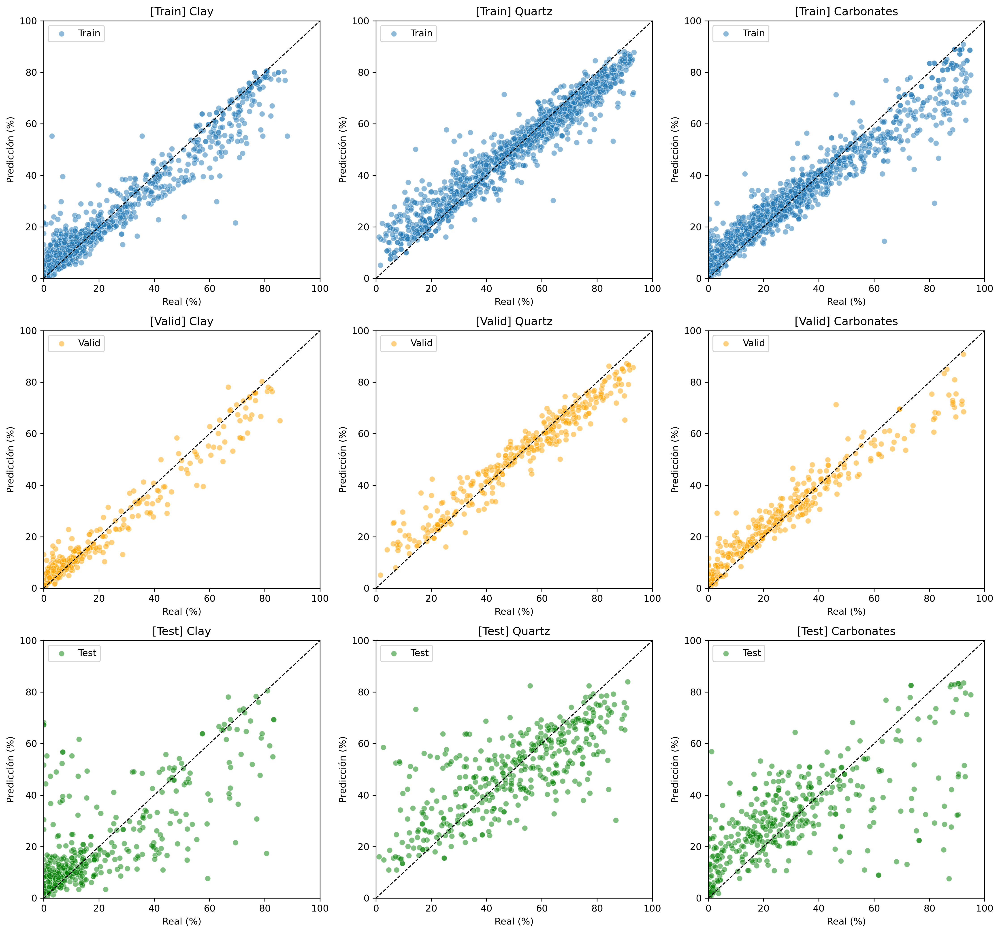

In [229]:
# === PREDICCIONES ===
y_train_pred = best_model.predict(X_train)
y_valid_pred = best_model.predict(X_valid)
y_test_pred = best_model.predict(X_test_final)

# === FUNCIÓN DE MÉTRICAS ===
def print_metrics(y_true, y_pred, stage=""):
    r2 = r2_score(y_true, y_pred, multioutput='raw_values')
    mae = mean_absolute_error(y_true, y_pred, multioutput='raw_values')
    rmse = np.sqrt(mean_squared_error(y_true, y_pred, multioutput='raw_values'))
    print(f"\n📊 Métricas — {stage}")
    for i, mineral in enumerate(target):
        print(f"{mineral} — R²: {r2[i]:.3f} | MAE: {mae[i]:.2f} | RMSE: {rmse[i]:.2f}")

# === MÉTRICAS POR CONJUNTO ===
print_metrics(y_train, y_train_pred, "ENTRENAMIENTO")
print_metrics(y_valid, y_valid_pred, "VALIDACIÓN")
print_metrics(y_test_final, y_test_pred, "TEST FINAL (ciego)")

# === VISUALIZACIÓN PREDICCIÓN VS REAL — POR CONJUNTO ===
fig, axes = plt.subplots(3, len(target), figsize=(5 * len(target), 14))

for i, mineral in enumerate(target):
    # Train
    sns.scatterplot(x=y_train[:, i], y=y_train_pred[:, i], ax=axes[0, i], alpha=0.5, label='Train')
    axes[0, i].set_title(f"[Train] {mineral}")
    axes[0, i].plot([0, 100], [0, 100], 'k--', lw=1)

    # Valid
    sns.scatterplot(x=y_valid[:, i], y=y_valid_pred[:, i], ax=axes[1, i], alpha=0.5, label='Valid', color='orange')
    axes[1, i].set_title(f"[Valid] {mineral}")
    axes[1, i].plot([0, 100], [0, 100], 'k--', lw=1)

    # Test
    sns.scatterplot(x=y_test_final[:, i], y=y_test_pred[:, i], ax=axes[2, i], alpha=0.5, label='Test', color='green')
    axes[2, i].set_title(f"[Test] {mineral}")
    axes[2, i].plot([0, 100], [0, 100], 'k--', lw=1)

    # Ejes y etiquetas
    for j in range(3):
        axes[j, i].set_xlim(0, 100)
        axes[j, i].set_ylim(0, 100)
        axes[j, i].set_xlabel("Real (%)")
        axes[j, i].set_ylabel("Predicción (%)")
        axes[j, i].legend()

plt.tight_layout()
plt.show()

In [230]:
# === DataFrame combinado para análisis de cierre composicional ===
result_df = pd.DataFrame({
    'Clay_Real': y_test_final[:, 0],
    'Quartz_Real': y_test_final[:, 1],
    'Carbonates_Real': y_test_final[:, 2],
    'Clay_Pred': y_test_pred[:, 0],
    'Quartz_Pred': y_test_pred[:, 1],
    'Carbonates_Pred': y_test_pred[:, 2]
})

# === Cálculo del cierre y del error absoluto ===
result_df['Suma_Real'] = result_df[['Clay_Real', 'Quartz_Real', 'Carbonates_Real']].sum(axis=1)
result_df['Suma_Pred'] = result_df[['Clay_Pred', 'Quartz_Pred', 'Carbonates_Pred']].sum(axis=1)
result_df['Closure_Error'] = abs(result_df['Suma_Pred'] - result_df['Suma_Real'])

# === Estadísticas del cierre ===
print("📊 Resumen estadístico del error de cierre (%):")
print(result_df['Closure_Error'].describe())

📊 Resumen estadístico del error de cierre (%):
count    4.110000e+02
mean     2.767191e+00
std      2.757959e+00
min      1.358416e-09
25%      6.381608e-01
50%      1.924853e+00
75%      3.993579e+00
max      1.551845e+01
Name: Closure_Error, dtype: float64


In [231]:
import numpy as np
import random

# Escoge un índice aleatorio del test set
idx = random.randint(0, len(y_test_final) - 1)

# Extrae los valores reales y predichos
real = y_test_final[idx]
pred = y_test_pred[idx]

# Calcula sumas y error de cierre
sum_real = np.sum(real)
sum_pred = np.sum(pred)
closure_error = abs(sum_pred - 100)

# Muestra resultados
print(f"Índice aleatorio: {idx}")
print("🔹 Valores reales     :", np.round(real, 2), f"Suma: {sum_real:.2f}%")
print("🔸 Predicción modelo  :", np.round(pred, 2), f"Suma: {sum_pred:.2f}%")
print(f"❗ Error de cierre: {closure_error:.2f}%")

Índice aleatorio: 315
🔹 Valores reales     : [ 2.76 77.59 19.66] Suma: 100.00%
🔸 Predicción modelo  : [ 4.1  78.2  18.62] Suma: 100.91%
❗ Error de cierre: 0.91%


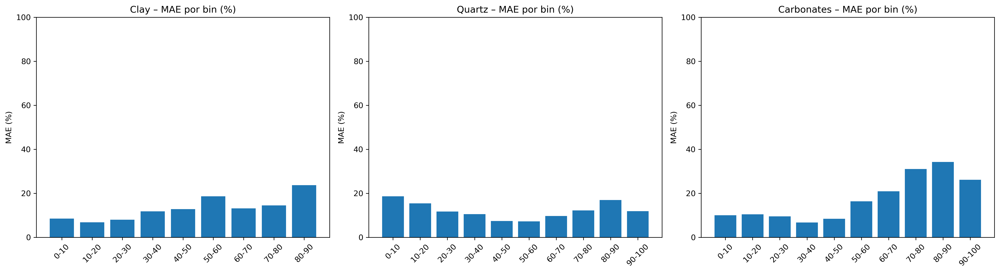

In [232]:
import matplotlib.pyplot as plt
import numpy as np

def plot_mae_by_bin(result_df, mineral):
    df = result_df.copy()  # 🔒 seguridad

    bins = np.arange(0, 101, 10)
    labels = [f'{bins[i]}-{bins[i+1]}' for i in range(len(bins)-1)]

    df[f'{mineral}_Bin'] = pd.cut(df[f'{mineral}_Real'], bins=bins, labels=labels, include_lowest=True)
    df[f'{mineral}_AbsError'] = abs(df[f'{mineral}_Pred'] - df[f'{mineral}_Real'])

    mae_by_bin = df.groupby(f'{mineral}_Bin')[f'{mineral}_AbsError'].mean()

    plt.bar(mae_by_bin.index.astype(str), mae_by_bin.values)
    plt.title(f'{mineral} – MAE por bin (%)')
    plt.ylabel('MAE (%)')
    plt.ylim(0, 100)
    plt.xticks(rotation=45)

# Gráfico por mineral
plt.figure(figsize=(18, 5))
for i, mineral in enumerate(['Clay', 'Quartz', 'Carbonates']):
    plt.subplot(1, 3, i+1)
    plot_mae_by_bin(result_df, mineral)
plt.tight_layout()
plt.show()


In [233]:
from sklearn.model_selection import KFold
from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

def evaluate_cv_rf_no_clr(X, y, target_names, best_params, n_splits=5):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

    fold = 1
    all_metrics = []

    for train_idx, test_idx in kf.split(X):
        print(f"\n{'-'*10} FOLD {fold} {'-'*10}")

        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        # Modelo con mejores hiperparámetros
        model = MultiOutputRegressor(
            RandomForestRegressor(
                n_estimators=best_params['estimator__n_estimators'],
                max_depth=best_params['estimator__max_depth'],
                min_samples_leaf=best_params['estimator__min_samples_leaf'],
                min_samples_split=best_params['estimator__min_samples_split'],
                random_state=42
            )
        )

        # Entrenamiento
        model.fit(X_train, y_train)

        # Predicción
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)

        # 🔍 GRÁFICOS: 3 scatter (uno por mineral, Train/Test)
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        for i, mineral in enumerate(target_names):
            sns.scatterplot(
                x=y_train[:, i], y=y_train_pred[:, i],
                ax=axes[i], color='red', alpha=0.5, s=20, label='Train'
            )
            sns.scatterplot(
                x=y_test[:, i], y=y_test_pred[:, i],
                ax=axes[i], color='blue', alpha=0.5, s=20, label='Test'
            )
            axes[i].plot([0, 100], [0, 100], 'k--', lw=1)
            axes[i].set_xlim(0, 100)
            axes[i].set_ylim(0, 100)
            axes[i].set_xlabel('Real (%)')
            axes[i].set_ylabel('Predicción (%)')
            axes[i].set_title(f'{mineral} — Pred vs Real')
            axes[i].legend()

        plt.tight_layout()
        plt.show()

        # 📊 MÉTRICAS
        metrics_fold = []
        for i, mineral in enumerate(target_names):
            r2_tr = r2_score(y_train[:, i], y_train_pred[:, i])
            mae_tr = mean_absolute_error(y_train[:, i], y_train_pred[:, i])
            rmse_tr = np.sqrt(mean_squared_error(y_train[:, i], y_train_pred[:, i]))

            r2_te = r2_score(y_test[:, i], y_test_pred[:, i])
            mae_te = mean_absolute_error(y_test[:, i], y_test_pred[:, i])
            rmse_te = np.sqrt(mean_squared_error(y_test[:, i], y_test_pred[:, i]))

            metrics_fold.append({
                "Mineral": mineral,
                "R² Train": round(r2_tr, 3),
                "MAE Train": round(mae_tr, 2),
                "RMSE Train": round(rmse_tr, 2),
                "R² Test": round(r2_te, 3),
                "MAE Test": round(mae_te, 2),
                "RMSE Test": round(rmse_te, 2)
            })

        df_metrics = pd.DataFrame(metrics_fold)
        display(df_metrics)
        all_metrics.append(df_metrics)

        fold += 1

    return all_metrics


---------- FOLD 1 ----------


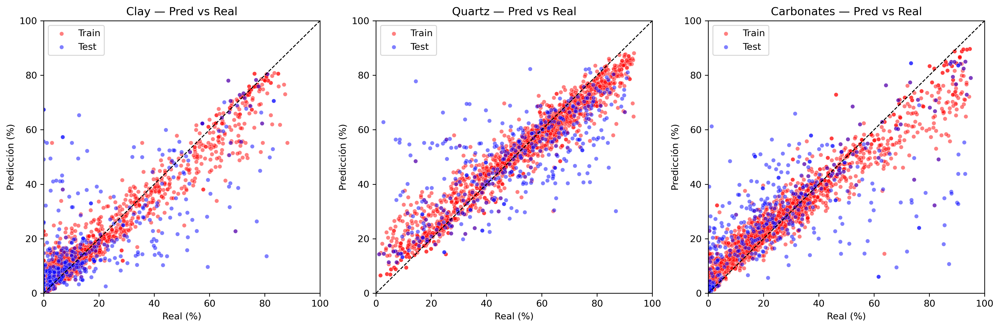

,Mineral,R² Train,MAE Train,RMSE Train,R² Test,MAE Test,RMSE Test
0,Clay,0.934,3.69,5.81,0.499,9.88,15.60
1,Quartz,0.916,4.83,6.65,0.525,11.18,15.30
2,Carbonates,0.911,5.11,7.35,0.473,12.50,18.23



---------- FOLD 2 ----------


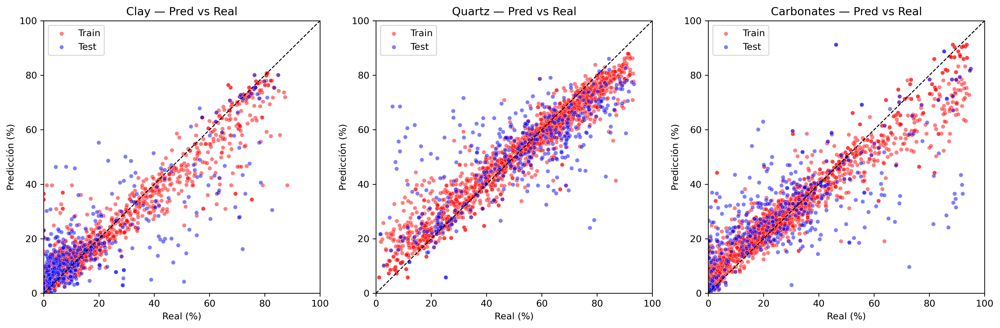

,Mineral,R² Train,MAE Train,RMSE Train,R² Test,MAE Test,RMSE Test
0,Clay,0.911,4.03,6.76,0.670,8.40,12.57
1,Quartz,0.906,5.03,7.05,0.556,10.74,14.84
2,Carbonates,0.898,5.42,7.99,0.498,11.83,16.69



---------- FOLD 3 ----------


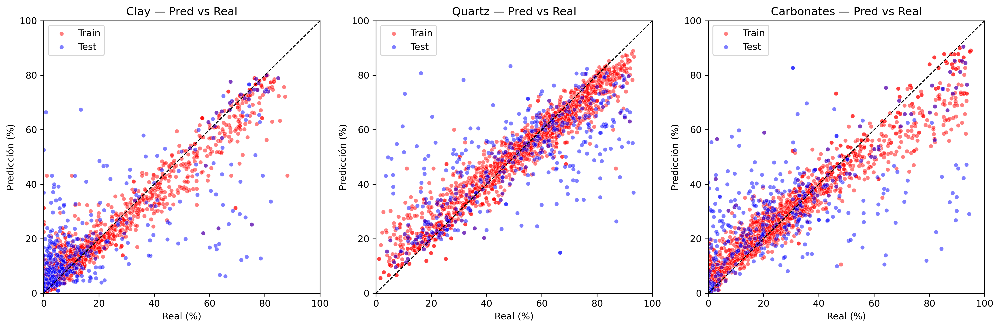

,Mineral,R² Train,MAE Train,RMSE Train,R² Test,MAE Test,RMSE Test
0,Clay,0.926,3.73,6.01,0.573,10.08,15.74
1,Quartz,0.913,4.78,6.64,0.483,12.31,17.20
2,Carbonates,0.904,5.22,7.66,0.404,13.34,19.14



---------- FOLD 4 ----------


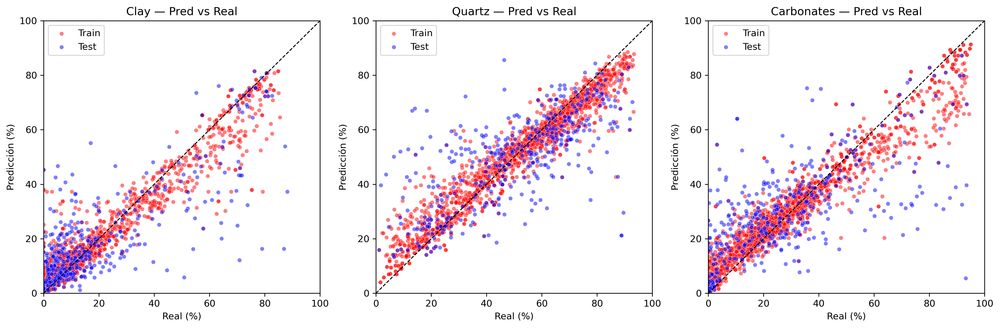

,Mineral,R² Train,MAE Train,RMSE Train,R² Test,MAE Test,RMSE Test
0,Clay,0.917,3.93,6.48,0.635,8.96,13.75
1,Quartz,0.911,4.91,6.87,0.490,11.39,15.70
2,Carbonates,0.905,5.30,7.74,0.448,12.07,17.26



---------- FOLD 5 ----------


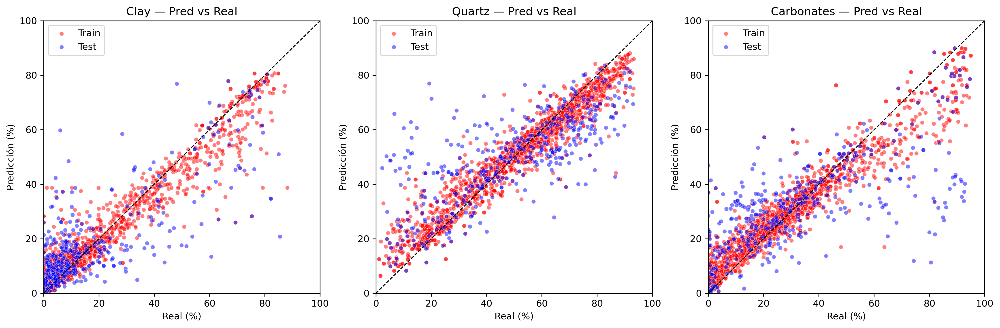

,Mineral,R² Train,MAE Train,RMSE Train,R² Test,MAE Test,RMSE Test
0,Clay,0.920,3.94,6.44,0.629,8.87,13.21
1,Quartz,0.911,4.84,6.74,0.531,11.88,16.16
2,Carbonates,0.898,5.20,7.71,0.496,12.98,18.77


In [234]:
target_names = ['Clay', 'Quartz', 'Carbonates']
fold_results = evaluate_cv_rf_no_clr(X, y, target_names, best_params, n_splits=5)